In [167]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options

import os, re, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
from sklearn.neighbors import NearestNeighbors
import libpysal
from pathlib import Path
from esda.moran import Moran_Local
from IPython.display import display
plt.rcParams['figure.dpi'] = 120

In [168]:
NSW_CSV   = "nsw.csv" 
MAIN_CSV  = "domain_realestate_cleaned_all_with_latlong.csv" 

In [169]:
OUTDIR = "exports"; os.makedirs(OUTDIR, exist_ok=True)


SYD_LAT, SYD_LON = -33.8688, 151.2093

In [170]:
def haversine_km(lat1, lon1, lat2, lon2):
    R = 6371.0; p = math.pi/180.0
    dlat = (lat2-lat1)*p; dlon = (lon2-lon1)*p
    a = np.sin(dlat/2)**2 + np.cos(lat1*p)*np.cos(lat2*p)*np.sin(dlon/2)**2
    return 2*R*np.arcsin(np.sqrt(a))

def clip01_log(s, q=(0.01,0.99)):
    x = np.log10(s)
    lo, hi = x.quantile(q)
    return (x.clip(lo, hi) - lo) / (hi - lo)


def map_type_from_nsw_row(row):
    txt = " ".join(str(row.get(c,"")) for c in ["Nature of property","Primary purpose"]).lower()
    return map_type_listings(txt)

In [171]:
def map_type_listings(s):
    s = str(s).lower()
    if any(k in s for k in ["apartment","unit","studio","flat","suite"]): return "Apartment/Unit"
    if "townhouse" in s: return "Townhouse"
    if "villa" in s: return "Villa"
    if "duplex" in s or "semi" in s: return "Duplex/Semi"
    if "terrace" in s or "row" in s: return "Terrace/Row"
    if any(k in s for k in ["vacant","land","lot"]): return "Vacant land"
    if any(k in s for k in ["rural","farm","acreage","lifestyle"]): return "Rural/Acreage"
    if any(k in s for k in ["commercial","office","retail","industrial","warehouse","shop"]): return "Commercial"
    if any(k in s for k in ["house","detached","residential"]): return "House"
    return "Other"

In [172]:
listings = pd.read_csv(MAIN_CSV)
listings["state"] = listings["state"].astype(str).str.upper()
listings = listings[listings["state"].str.contains("NSW", na=False)]
listings["Price"] = pd.to_numeric(listings["Price"], errors="coerce")
listings["Size"]  = pd.to_numeric(listings.get("Size"), errors="coerce")
listings["lat"]   = pd.to_numeric(listings["lat"], errors="coerce")
listings["lon"]   = pd.to_numeric(listings["lon"], errors="coerce")
listings["Type_std"] = listings["Type"].map(map_type_listings)

1 Heatmap price NSW

In [173]:
nsw_heat = listings.dropna(subset=["Price","lat","lon"]).query("Price>0")
if not nsw_heat.empty:
    center = [nsw_heat["lat"].median(), nsw_heat["lon"].median()]
    m = folium.Map(location=center, zoom_start=10, tiles=None)
    folium.TileLayer("OpenStreetMap", name="OSM").add_to(m)
    folium.TileLayer(
        tiles=("https://services.arcgisonline.com/ArcGIS/rest/services/"
               "World_Imagery/MapServer/tile/{z}/{y}/{x}"),
        attr="Esri WorldImagery", name="Satellite"
    ).add_to(m)
    w = clip01_log(nsw_heat["Price"])
    HeatMap(list(zip(nsw_heat["lat"], nsw_heat["lon"], w)), radius=18, blur=28).add_to(m)
    folium.LayerControl().add_to(m)
    m.save(os.path.join(OUTDIR, "1.Nsw_price_heatmap.html"))

html_path = os.path.join(OUTDIR, "1.Nsw_price_heatmap.html")
png_path = os.path.join(OUTDIR, "1.Nsw_price_heatmap.png")

opts = Options()
opts.add_argument("--headless")
opts.add_argument("--no-sandbox")
opts.add_argument("--disable-dev-shm-usage")
driver = webdriver.Chrome(options=opts)
driver.set_window_size(1200, 900)
driver.get("file://" + os.path.abspath(html_path))
driver.save_screenshot(png_path)
driver.quit()
m



Mục tiêu:
Biểu đồ Heatmap Price NSW được xây dựng nhằm trực quan hóa sự phân bố giá nhà theo tọa độ địa lý trên toàn bang New South Wales. Mục tiêu chính là xác định các khu vực có mức giá cao hoặc thấp, qua đó nhận diện “vùng nóng” của thị trường bất động sản. Kết quả giúp đánh giá mức độ tập trung giá nhà theo khu vực và hỗ trợ định hướng nghiên cứu, đầu tư hoặc quy hoạch phát triển đô thị trong tương lai.

Kết luận:
Bản đồ Heatmap Price NSW cho thấy giá nhà tập trung cao tại khu vực Sydney và các vùng phụ cận phía Đông, phản ánh đặc điểm đô thị hóa mạnh và nhu cầu nhà ở lớn. Khi di chuyển ra xa trung tâm, mức giá giảm dần, thể hiện sự chênh lệch rõ rệt giữa thành thị và nông thôn. Kết quả này cho thấy thị trường bất động sản NSW có tính tập trung cao và chu kỳ tăng giá chủ yếu xoay quanh khu vực đô thị lớn, tạo nền tảng cho các phân tích chuyên sâu về xu hướng đầu tư theo vị trí.

2. Property Price Comparison by Type across NSW Regions

C:\Users\ACER\AppData\Local\Temp\ipykernel_6800\3826208554.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(g.index.astype(str), rotation=60, ha="right", fontsize=8)
C:\Users\ACER\AppData\Local\Temp\ipykernel_6800\3826208554.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(g.index.astype(str), rotation=60, ha="right", fontsize=8)
C:\Users\ACER\AppData\Local\Temp\ipykernel_6800\3826208554.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(g.index.astype(str), rotation=60, ha="right", fontsize=8)
C:\Users\ACER\AppData\Local\Temp\ipykernel_6800\3826208554.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a F

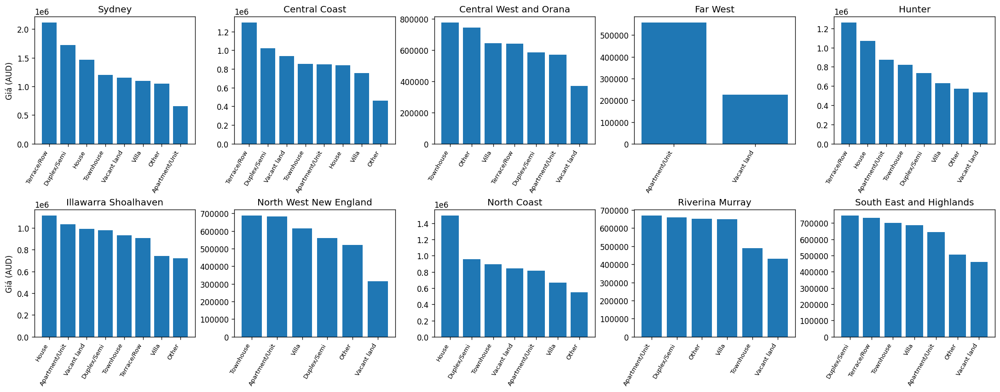

Đã lưu: exports\ 2. Property_price_comparison_by_region.png


In [174]:
t = listings.dropna(subset=["Price","Type_std","lat","lon"]).query("Price>0").copy()
if not t.empty:
    centers = np.array(list(REGIONS.values())); names = list(REGIONS.keys())
    dists = np.column_stack([haversine_km(t["lat"].values, t["lon"].values, la, lo) for la,lo in centers])
    t["region"] = np.array(names)[dists.argmin(axis=1)]
    hi = t["Price"].quantile(0.99); t = t[t["Price"] <= hi]

    TOP_TYPES, MIN_PER_TYPE = 10, 2
    fig, axes = plt.subplots(2, 5, figsize=(18, 7), dpi=120, constrained_layout=True)
    axes = axes.ravel()
    for i, reg in enumerate(names):
        ax = axes[i]; sub = t[t["region"]==reg]
        if sub.empty:
            ax.set_title(f"{reg} (no data)"); ax.axis("off"); continue
        g = (sub.groupby("Type_std")["Price"]
                .agg(median="median", n="size")
                .query("n >= @MIN_PER_TYPE")
                .sort_values("median", ascending=False)
                .head(TOP_TYPES))
        if g.empty: ax.set_title(f"{reg} (n<min)"); ax.axis("off"); continue
        ax.bar(g.index.astype(str), g["median"])
        ax.set_title(reg)
        ax.set_xticklabels(g.index.astype(str), rotation=60, ha="right", fontsize=8)
        if i % 5 == 0: ax.set_ylabel("Giá (AUD)")
    



OUTDIR = "exports"
os.makedirs(OUTDIR, exist_ok=True)
outpng = os.path.join(OUTDIR, " 2. Property_price_comparison_by_region.png")
plt.savefig(outpng, dpi=300, bbox_inches="tight")
plt.show()
print("Đã lưu:", outpng)
plt.show()


Biểu đồ “Property Price Comparison by Region” được xây dựng nhằm so sánh giá nhà trung vị giữa các loại hình bất động sản ở từng vùng của bang New South Wales (NSW). Mục tiêu chính là nhận diện sự khác biệt về mức giá giữa các khu vực đô thị và vùng ngoại ô, đồng thời xác định loại hình nhà ở phổ biến và có giá trị cao nhất trong mỗi khu vực. Kết quả giúp người xem hiểu rõ hơn về cấu trúc giá và xu hướng thị trường bất động sản theo từng vùng địa lý.

Kết luận:

Kết quả cho thấy khu vực Sydney và vùng lân cận có giá trung vị cao nhất, đặc biệt là các loại hình như House và Apartment. Các vùng xa trung tâm như Central West hay Far West có mức giá thấp hơn đáng kể, phản ánh sự chênh lệch kinh tế và mật độ dân cư giữa các vùng. Nhìn chung, biểu đồ thể hiện mối tương quan rõ rệt giữa vị trí địa lý và giá bất động sản, cho thấy thị trường NSW vẫn tập trung mạnh quanh khu đô thị lớn, trong khi các vùng xa hơn giữ vai trò hỗ trợ với giá thấp và ổn định hơn.

3. Moran's I - LISA

In [175]:
STATE_FILTER, USE_LOG, K, ALPHA = True, True, 8, 0.05
g = listings.copy()
g = g.dropna(subset=["Price","lat","lon"])
if len(g) >= K+1:
    x = np.log10(g["Price"].values) if USE_LOG else g["Price"].values
    z = (x - x.mean()) / x.std(ddof=1)
    coords = g[["lat","lon"]].to_numpy()

    nn = NearestNeighbors(n_neighbors=K+1, algorithm="ball_tree").fit(coords)
    _, idx = nn.kneighbors(coords)
    neighbors = {i: idx[i,1:].tolist() for i in range(len(g))}
    w = libpysal.weights.W(neighbors); w.transform = "r"

    mli = Moran_Local(z, w, permutations=999)
    quad, sig = mli.q, (mli.p_sim < ALPHA)
    labels_map = {1:"Cao-Cao", 2:"Cao-Thấp", 3:"Thấp-Thấp", 4:"Thấp-Cao"}
    labels = np.where(sig, [labels_map[q] for q in quad], "Không ý nghĩa")

    out = g[["lat","lon","Price"]].copy()
    out["group"] = labels; out["p_value"] = mli.p_sim; out["Ii"] = mli.Is

    center = [out["lat"].median(), out["lon"].median()]
    m_lisa = folium.Map(location=center, zoom_start=10, tiles=None)
    folium.TileLayer("OpenStreetMap", name="OSM", show=True).add_to(m_lisa)
    folium.TileLayer(
        tiles=("https://services.arcgisonline.com/ArcGIS/rest/services/"
               "World_Imagery/MapServer/tile/{z}/{y}/{x}"),
        attr="Esri WorldImagery", name="Satellite", show=False
    ).add_to(m_lisa)
    colors = {"Cao-Cao":"#d7191c","Thấp-Thấp":"#2c7bb6","Cao-Thấp":"#fdae61","Thấp-Cao":"#abd9e9","Không ý nghĩa":"#aaaaaa"}
    plot_df = out if len(out) <= 20000 else out.sample(20000, random_state=0)
    for _, r in plot_df.iterrows():
        folium.CircleMarker([r.lat, r.lon], radius=4, color=colors[r.group],
            fill=True, fill_opacity=0.8, weight=0.5,
            tooltip=(f"<b>{r.group}</b><br>Giá: {r.Price:,.0f}<br>Ii: {r.Ii:.3f} | p: {r.p_value:.3f}")
        ).add_to(m_lisa)
    m_lisa.save(os.path.join(OUTDIR, "3. Nsw_lisa_clusters.html"))



html_path = os.path.join(OUTDIR, "3. Nsw_lisa_clusters.html")
png_path = os.path.join(OUTDIR, "3. Nsw_lisa_clusters.png")
opts = Options()
opts.add_argument("--headless")
opts.add_argument("--no-sandbox")
opts.add_argument("--disable-dev-shm-usage")
driver = webdriver.Chrome(options=opts)
driver.set_window_size(1200, 900)
driver.get("file://" + os.path.abspath(html_path))
driver.save_screenshot(png_path)
driver.quit()

m_lisa

C:\Users\ACER\AppData\Local\Temp\ipykernel_6800\2378595897.py:12: UserWarning: The weights matrix is not fully connected: 
 There are 37 disconnected components.
  w = libpysal.weights.W(neighbors); w.transform = "r"


Mục tiêu

Phần bản đồ m_lisa được xây dựng để:

Phân tích sự tự tương quan không gian (spatial autocorrelation) của giá nhà tại bang NSW — tức là xem liệu giá nhà ở một khu vực có xu hướng giống hoặc khác biệt đáng kể so với các khu vực lân cận.

Phát hiện các cụm (clusters) theo mô hình LISA:

Cao–Cao (High–High): Khu vực có giá nhà cao, bao quanh bởi các khu vực cũng có giá cao.

Thấp–Thấp (Low–Low): Khu vực có giá thấp, nằm gần các khu vực cũng có giá thấp.

Cao–Thấp (High–Low): Giá nhà cao nhưng nằm giữa vùng giá thấp → khu “đột biến cao”.

Thấp–Cao (Low–High): Giá thấp giữa vùng giá cao → khu “đột biến thấp”.

Kết luận:

Dữ liệu giá nhà NSW thể hiện các vùng tập trung giá cao và giá thấp rõ rệt, chứng tỏ giá nhà có tính không gian (spatial dependence).

Các cụm Cao–Cao (đỏ) thường nằm ở khu vực trung tâm thành phố hoặc vùng phát triển, nơi thị trường bất động sản nóng.

Các cụm Thấp–Thấp (xanh đậm) nằm ở vùng ven hoặc ngoại ô, cho thấy giá nhà thấp có xu hướng tập trung gần nhau.

Các vùng Cao–Thấp và Thấp–Cao (màu vàng và xanh nhạt) là vùng chuyển tiếp, có thể đại diện cho khu vực đang phát triển hoặc biến động giá.

Kết quả giúp xác định khu vực có xu hướng bất thường về giá nhà, hỗ trợ hoạch định chính sách, đầu tư, và quy hoạch đô thị.

4. Top 5 most sold property types

Đã lưu: exports\4. NSW_ Top 5 most sold property types (2021-2025).png


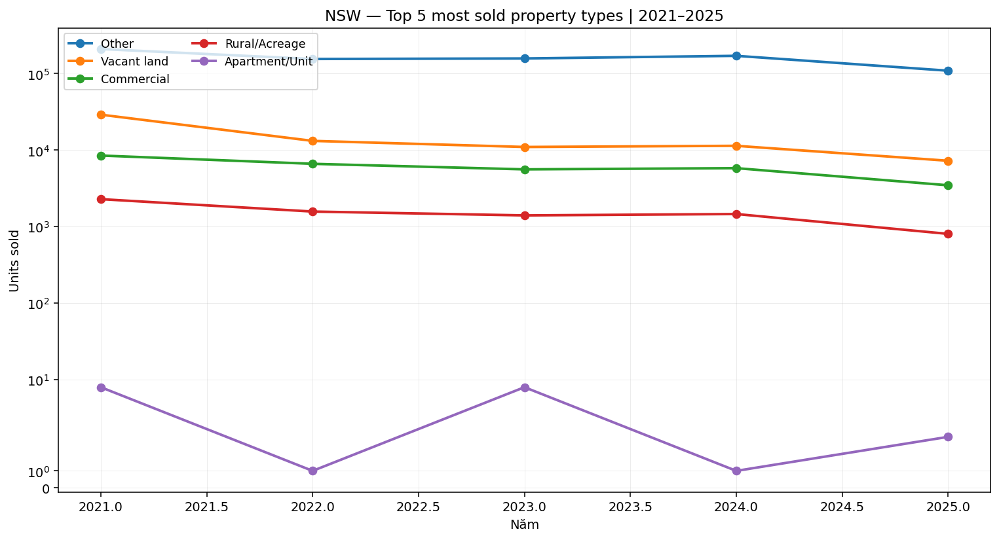

In [176]:
nsw = pd.read_csv(NSW_CSV, encoding="utf-8", encoding_errors="ignore", on_bad_lines="skip")
nsw["Contract date"] = pd.to_datetime(nsw["Contract date"], errors="coerce")
nsw["Type_inferred"] = nsw.apply(map_type_from_nsw_row, axis=1)
nsw_ = nsw.dropna(subset=["Contract date","Type_inferred"]).copy()
nsw_["year"] = nsw_["Contract date"].dt.year.astype("Int64")
N_YEARS   = 5
this_year = int(nsw_["year"].max())
start_year = this_year - (N_YEARS - 1)
mask_5y   = nsw_["year"].between(start_year, this_year)
counts = (nsw_.loc[mask_5y]
          .groupby(["year","Type_inferred"]).size().rename("n").reset_index())
tot_5y = counts.groupby("Type_inferred")["n"].sum().sort_values(ascending=False)
top_types = tot_5y.head(5).index.tolist()
pv = (counts[counts["Type_inferred"].isin(top_types)]
      .pivot_table(index="year", columns="Type_inferred", values="n", aggfunc="sum", fill_value=0)
      .reindex(range(start_year, this_year+1), fill_value=0)
      .reindex(columns=top_types, fill_value=0))
plt.figure(figsize=(11,6), dpi=140)
for col in pv.columns:
    plt.plot(pv.index, pv[col], marker="o", linewidth=2, label=col)
plt.xlabel("Năm"); plt.ylabel("Units sold")
plt.title(f"NSW — Top 5 most sold property types | {start_year}–{this_year}")
plt.legend(loc="upper left", fontsize=9, ncol=2)
plt.yscale("symlog", linthresh=5)
plt.grid(True, linewidth=0.3, alpha=0.4)
plt.tight_layout()
outpng = os.path.join(OUTDIR, "4. NSW_ Top 5 most sold property types (2021-2025).png")
plt.savefig(outpng, dpi=300, bbox_inches="tight")
print("Đã lưu:", outpng)

plt.show()

Mục tiêu

Phân tích xu hướng thay đổi số lượng giao dịch bất động sản theo từng loại hình (property type) tại NSW trong 5 năm gần nhất nhằm theo dõi xu hướng giao dịch qua từng năm và xác định loại hình nào chiếm ưu thế trên thị trường.Trực quan hóa dữ liệu bằng biểu đồ đường (Line Chart) để dễ dàng quan sát tốc độ tăng/giảm của từng loại hình qua các năm.

Kết luận:
Loại “Other” (House, Unit, Townhouse, Land, Villa) chiếm tỷ trọng giao dịch cao nhất, ổn định quanh mức trên 100.000 giao dịch/năm → cho thấy đây là nhóm tổng hợp có sức hút lớn nhất.

“Vacant land” và “Commercial” đứng kế tiếp, duy trì mức giao dịch trung bình từ vài nghìn đến hàng chục nghìn đơn vị, thể hiện nhu cầu ổn định với đất trống và bất động sản thương mại.

“Rural/Acreage” có xu hướng giảm nhẹ, phản ánh sự suy yếu trong đầu tư bất động sản nông thôn.

“Apartment/Unit” duy trì số lượng rất thấp và biến động mạnh qua các năm, cho thấy phân khúc này kém sôi động hơn hẳn so với các loại hình khác.

→ Tổng thể, thị trường NSW giai đoạn 2021–2025 duy trì ổn định, không có biến động lớn về cơ cấu loại hình bất động sản, phản ánh tính bền vững của nhu cầu nhà đất tại khu vực này.



5. NSW-Density (Hexbin) Price and Size

Đã lưu: exports\5. NSW- Density (Hexbin) Price vs Size.png


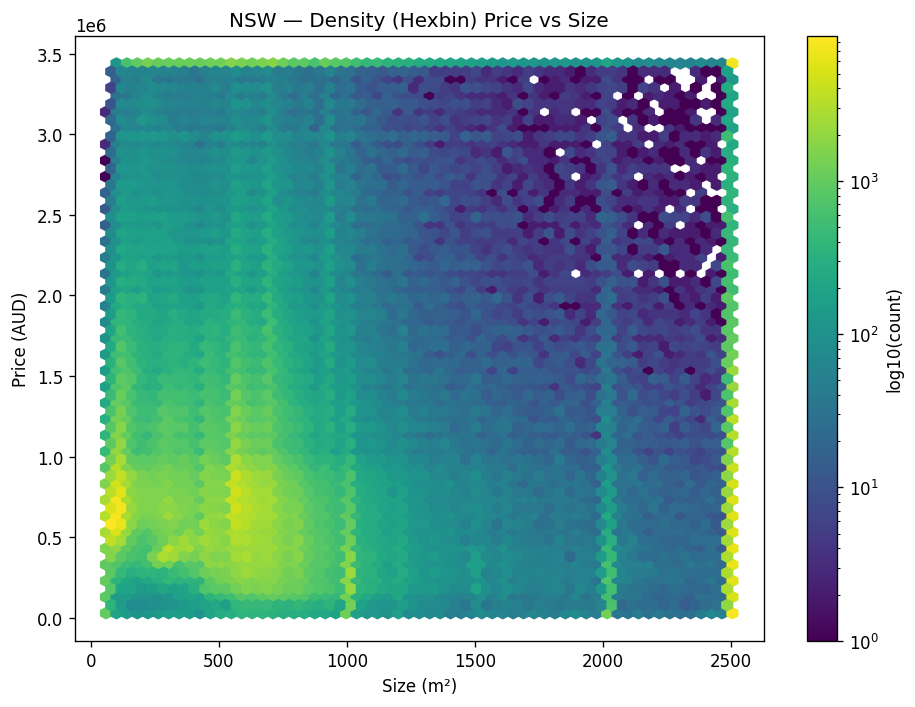

In [177]:
nsw_pp = nsw.copy()
nsw_pp["Price"] = pd.to_numeric(nsw_pp["Purchase price"], errors="coerce")
nsw_pp["Size"]  = pd.to_numeric(nsw_pp["Area"], errors="coerce")
if "Area type" in nsw_pp.columns:
    at = nsw_pp["Area type"].astype(str).str.upper().str.strip()
    nsw_pp.loc[at.eq("H"), "Size"] = nsw_pp.loc[at.eq("H"), "Size"] * 10000.0

df_viz = nsw_pp.dropna(subset=["Price","Size"])
df_viz = df_viz[(df_viz["Price"]>0) & (df_viz["Size"]>0)].copy()

p1, p99 = df_viz["Price"].quantile([0.01,0.99]); s1, s99 = df_viz["Size"].quantile([0.01,0.99])
df_viz["Price"] = df_viz["Price"].clip(p1, p99); df_viz["Size"] = df_viz["Size"].clip(s1, s99)
def iqr_clip(s, k=3.0):
    q1, q3 = s.quantile([0.25, 0.75]); iqr = q3 - q1
    return s.clip(q1 - k*iqr, q3 + k*iqr)
df_viz["Price"] = iqr_clip(df_viz["Price"]); df_viz["Size"] = iqr_clip(df_viz["Size"])

plt.figure(figsize=(8,6))
hb = plt.hexbin(df_viz["Size"], df_viz["Price"], gridsize=60, bins="log")
plt.colorbar(hb).set_label("log10(count)")
plt.xlabel("Size (m²)"); plt.ylabel("Price (AUD)")
plt.title("NSW — Density (Hexbin) Price vs Size")
plt.tight_layout()

outpng = os.path.join(OUTDIR, "5. NSW- Density (Hexbin) Price vs Size.png")
plt.savefig(outpng, dpi=300, bbox_inches="tight")
print("Đã lưu:", outpng)

plt.show()


Mục tiêu:
Xác định mối quan hệ giữa giá bán (Price) và diện tích (Size) của bất động sản tại bang NSW, đồng thời phát hiện các khu vực tập trung mật độ giao dịch cao. Biểu đồ Hexbin giúp trực quan hóa hàng chục nghìn điểm dữ liệu, thể hiện mức độ phân bố và xu hướng giá theo diện tích một cách rõ ràng.

Kết luận:
Mật độ điểm dày (vùng vàng–xanh lá) tập trung chủ yếu quanh diện tích dưới 600 m² và giá dưới 1 triệu AUD, nghĩa là đây là nhóm nhà ở phổ biến nhất.

Khi diện tích tăng, giá có xu hướng tăng, nhưng mức độ phân tán (vùng màu xanh–tím) cũng lớn hơn — chứng tỏ sự khác biệt mạnh giữa các loại hình (đất trống, biệt thự, thương mại...).

Một số điểm rời rạc ở vùng >2000 m² và >3 triệu AUD cho thấy các bất động sản cao cấp, ít xuất hiện hơn.

Khi diện tích tăng, giá cũng có xu hướng tăng, tuy nhiên mức tăng không tuyến tính, cho thấy ảnh hưởng của yếu tố vị trí và loại hình bất động sản.
Nhìn chung, biểu đồ thể hiện mối quan hệ tỷ lệ thuận giữa giá và diện tích, đồng thời cho thấy sự đa dạng và phân tầng rõ rệt trong thị trường bất động sản NSW.

6.Sydney - Price Hotspots (Scatter)

Số điểm: 4851 | Đã lưu: exports\sydney_price_hotspots_scatter.png
Đã lưu: exports\6. Sydney - Price Hostpots (Scatter).png


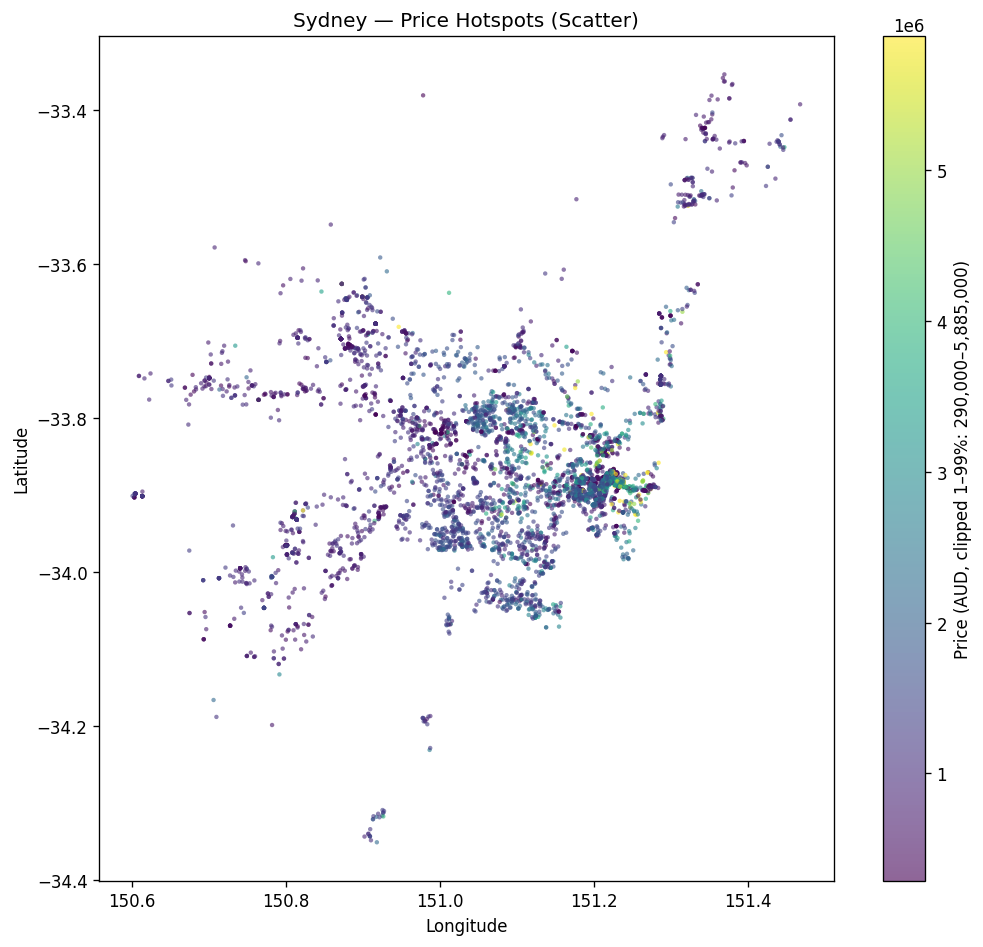

In [178]:
dhot = (listings.dropna(subset=["Price","lat","lon"])
        .query("Price>0").copy())
dhot["dist_km"] = haversine_km(dhot["lat"].values, dhot["lon"].values, SYD_LAT, SYD_LON)
dhot = dhot[(dhot["dist_km"] <= 60) &
            dhot["lat"].between(-44, -9) &
            dhot["lon"].between(111, 154)]
if not dhot.empty:
    lo, hi = dhot["Price"].quantile([0.01, 0.99])
    dhot["_price_c"] = dhot["Price"].clip(lo, hi)
    plt.figure(figsize=(9, 8), dpi=120)
    sc = plt.scatter(dhot["lon"], dhot["lat"], c=dhot["_price_c"], s=7, alpha=0.6, linewidths=0)
    cb = plt.colorbar(sc); cb.set_label(f"Price (AUD, clipped 1–99%: {int(lo):,}–{int(hi):,})")
    plt.xlabel("Longitude"); plt.ylabel("Latitude")
    plt.title("Sydney — Price Hotspots (Scatter)")
    plt.gca().set_aspect("equal", adjustable="box")
    plt.tight_layout()
    outpng = os.path.join(OUTDIR, "sydney_price_hotspots_scatter.png")
    print("Số điểm:", len(dhot), "| Đã lưu:", outpng)


outpng = os.path.join(OUTDIR, "6. Sydney - Price Hostpots (Scatter).png")
plt.savefig(outpng, dpi=300, bbox_inches="tight")
print("Đã lưu:", outpng)

plt.show()

Mục tiêu:
Biểu đồ Scatter này nhằm xác định các khu vực có giá bất động sản cao (hotspots) tại Sydney, thông qua phân tích mối quan hệ giữa tọa độ địa lý (vĩ độ, kinh độ) và giá nhà (Price). Bằng cách lọc dữ liệu trong phạm vi 60 km quanh trung tâm Sydney và loại bỏ ngoại lệ (1–99%), biểu đồ giúp nhận diện rõ sự phân bố không gian của giá trị bất động sản.

Kết luận:
Kết quả cho thấy giá nhà tập trung cao nhất quanh trung tâm Sydney, đặc biệt ở các khu vực ven cảng và khu nội thành. Màu vàng–xanh lục thể hiện các điểm nóng về giá (price hotspots), trong khi vùng ngoại ô xa hơn (màu tím–xanh dương) có mức giá thấp hơn rõ rệt.
Điều này chứng minh xu hướng giá giảm dần khi rời xa trung tâm thành phố, phản ánh sự chênh lệch giá địa lý rõ rệt trong thị trường bất động sản Sydney.

7.Violin Plot -Price by Type (NSW)

Đã lưu: exports\7. Violin Plot- Price by Type (NSW).png


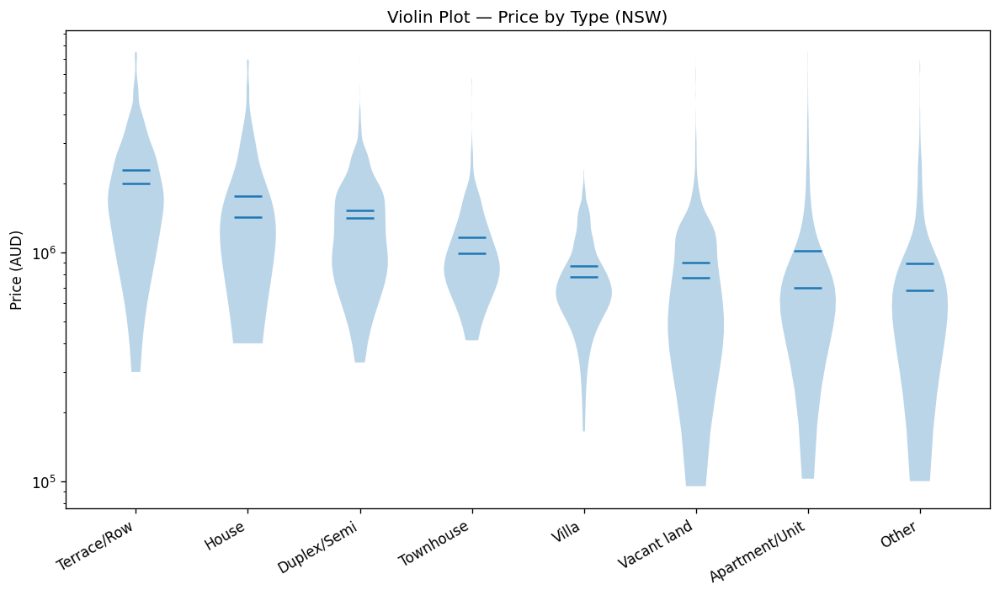

In [179]:
base = listings.dropna(subset=["Price","Type_std"]).query("Price>0").copy()
stats = (base.groupby("Type_std")["Price"]
         .agg(n="size", mean="mean", median="median",
              p10=lambda x: np.percentile(x,10),
              p90=lambda x: np.percentile(x,90))
         .sort_values("median", ascending=False))
stats_f = stats[stats["n"] >= 30] if (stats["n"]>=30).any() else stats.head(8)
cats = stats_f.index.tolist()
data = [base.loc[base["Type_std"]==c, "Price"].values for c in cats]

outpng = os.path.join(OUTDIR, "violin_price_by_type.png")
outcsv = os.path.join(OUTDIR, "summary_price_by_type.csv")

plt.figure(figsize=(10,6))
plt.violinplot(data, showmeans=True, showmedians=True, showextrema=False)
plt.xticks(range(1, len(cats)+1), [str(c) for c in cats], rotation=30, ha="right")
plt.ylabel("Price (AUD)")
plt.title("Violin Plot — Price by Type (NSW)")
plt.yscale("log")
plt.tight_layout(); 
outpng = os.path.join(OUTDIR, "7. Violin Plot- Price by Type (NSW).png")
plt.savefig(outpng, dpi=300, bbox_inches="tight")
print("Đã lưu:", outpng)

plt.show()

Mục tiêu:
Biểu đồ Violin này nhằm so sánh sự phân bố giá bất động sản (Price) giữa các loại hình nhà ở khác nhau tại bang New South Wales (NSW).
Mỗi “violin” biểu thị phạm vi giá từ thấp đến cao, trong đó:

Phần rộng biểu thị khu vực giá tập trung nhiều.

Đường ngang dày ở giữa là trung bình (mean).

Đường ngang mảnh hơn là trung vị (median).

Trục tung thể hiện giá (đơn vị AUD) theo thang logarit, giúp dễ so sánh các loại có chênh lệch lớn.


Quan sát chính: 
Terrace/Row có giá cao nhất, phân bố rộng → loại hình này thường ở khu trung tâm, giá cao do vị trí đắc địa.

House và Duplex/Semi cũng có mức giá cao, phân bố rộng nhưng ổn định hơn Terrace/Row → nhóm nhà ở truyền thống, phổ biến trong khu dân cư cao cấp.

Townhouse và Apartment/Unit có giá thấp hơn, phân bố hẹp hơn → phù hợp cho người thu nhập trung bình, ít chênh lệch giữa các bất động sản.

Vacant Land (đất trống) cho thấy độ phân tán giá rất lớn → giá phụ thuộc mạnh vào vị trí, diện tích và quy hoạch.

Villa và Other nằm ở nhóm trung bình, dao động nhẹ, thể hiện quy mô nhỏ hoặc ít phổ biến.

Kết luận:
Biểu đồ cho thấy sự chênh lệch đáng kể về giá giữa các loại hình nhà ở tại NSW, phản ánh:

Sự đa dạng của thị trường bất động sản, từ cao cấp (House, Terrace/Row) đến trung cấp (Apartment, Townhouse).

Xu hướng chu kỳ giá ổn định, khi các loại hình có giá cao vẫn duy trì vị thế qua thời gian.

Dữ liệu mang tính tập trung mạnh theo loại hình, hữu ích cho việc định giá, phân khúc thị trường và dự báo xu hướng đầu tư.

8.Sydney: Median by Distance to CBD (5km bins)

C:\Users\ACER\AppData\Local\Temp\ipykernel_6800\1822883801.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  med8 = (b8.groupby("dist_bin")["Price"].median().reset_index())


Đã lưu: exports\8.Sydney_Median_Price_by_Distance_to_CBD_5km_bins.png


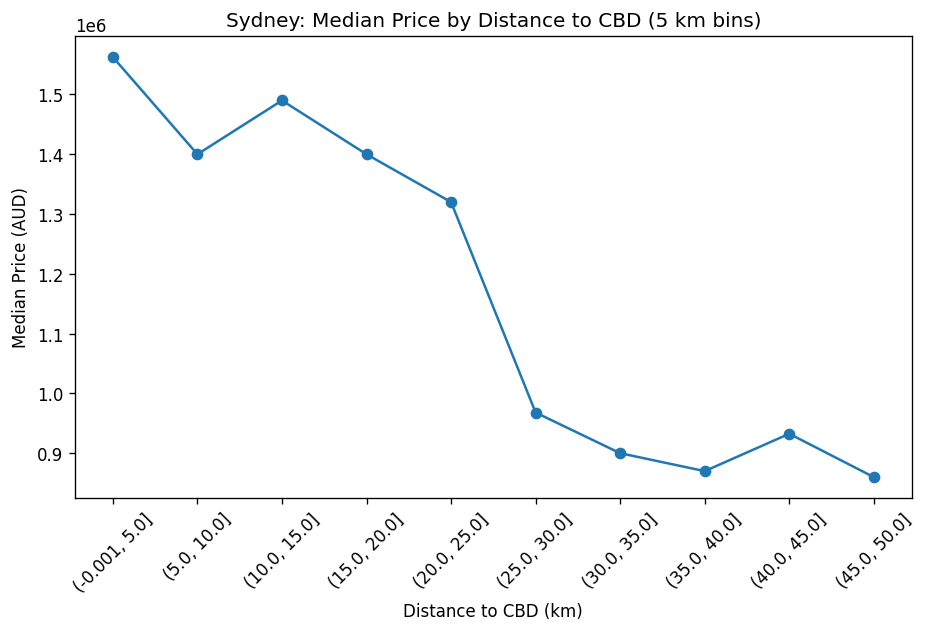

In [180]:
b8 = listings.dropna(subset=["Price","lat","lon"]).query("Price>0").copy()
b8["dist_km"] = haversine_km(b8["lat"].values, b8["lon"].values, SYD_LAT, SYD_LON)
b8 = b8[b8["dist_km"] <= 50].copy()
if not b8.empty:
    b8["dist_bin"] = pd.cut(b8["dist_km"], bins=np.arange(0, 55, 5), include_lowest=True)
    med8 = (b8.groupby("dist_bin")["Price"].median().reset_index())
    plt.figure(figsize=(9,5))
    plt.plot(med8["dist_bin"].astype(str), med8["Price"], marker="o")
    plt.title("Sydney: Median Price by Distance to CBD (5 km bins)")
    plt.xlabel("Distance to CBD (km)"); plt.ylabel("Median Price (AUD)")
    plt.xticks(rotation=45)

    os.makedirs(OUTDIR, exist_ok=True)
    outpng = os.path.join(OUTDIR, "8.Sydney_Median_Price_by_Distance_to_CBD_5km_bins.png")
    plt.savefig(outpng, dpi=300, bbox_inches="tight")
    print("Đã lưu:", outpng)

    plt.show()
else:
    print("Not data")

Mục tiêu:
Biểu đồ này nhằm thể hiện mối quan hệ giữa giá trung vị (Median Price) của bất động sản và khoảng cách tới trung tâm Sydney (CBD).
Dữ liệu được chia thành các khoảng cách 5 km (5 km bins) để dễ dàng quan sát xu hướng thay đổi của giá theo vị trí địa lý.

Quan sát chính: 
Khi khoảng cách càng gần trung tâm (0–5 km), giá trung vị bất động sản đạt mức cao nhất (~1.6 triệu AUD).

Từ 5–25 km, giá dao động nhẹ nhưng vẫn duy trì ở mức cao (~1.3–1.5 triệu AUD).

Từ 25 km trở ra, giá giảm rõ rệt, đặc biệt từ khoảng 25–35 km trở đi chỉ còn quanh 900.000–1.000.000 AUD.

Một số khu vực xa hơn (40–45 km) có xu hướng tăng nhẹ trở lại, có thể do sự phát triển của các vùng ven đô hoặc các khu dân cư mới.

Nhìn chung, đường biểu diễn có xu hướng giảm dần theo khoảng cách, phản ánh sự mất giá trị theo độ xa trung tâm.

Kết luận:

Biểu đồ cho thấy mối quan hệ nghịch đảo giữa giá bất động sản và khoảng cách tới trung tâm Sydney.

Nhà gần trung tâm (CBD) có giá cao do lợi thế về vị trí, giao thông, việc làm và tiện ích.

Khi đi xa hơn, giá giảm mạnh do mật độ dân cư thưa, ít dịch vụ và cơ hội kinh tế thấp hơn.

Tuy nhiên, một số khu xa trung tâm vẫn có mức giá nhỉnh hơn trung bình, cho thấy tiềm năng phát triển đô thị và đầu tư trong tương lai.

9 TOP Property Types Near The Coast (≤10 km) 

Đã lưu: exports\9. top_property_types_near_coast_10km.png


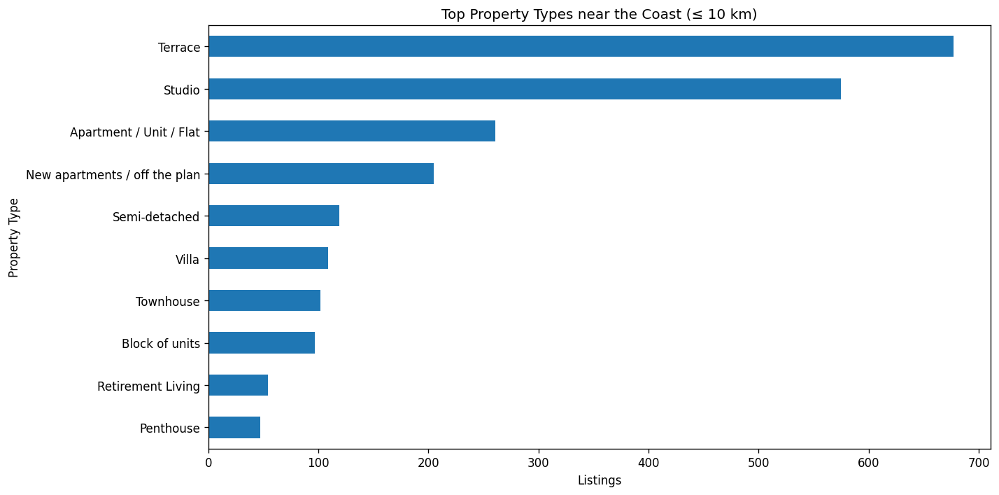

In [181]:
df = pd.read_csv(MAIN_CSV)
df["state"] = df["state"].astype(str).str.upper()
df = df[df["state"].str.contains("NSW", na=False)].copy()
for c in ["Price","lat","lon"]:
    df[c] = pd.to_numeric(df[c], errors="coerce")
src = (df.dropna(subset=["Price","lat","lon","Type"])
         .query("Price>0")
         .copy())

latv, lonv = src["lat"].values, src["lon"].values
min_d = np.full(len(src), np.inf)
for clat, clon in COASTAL_POINTS:
    min_d = np.minimum(min_d, haversine_km(latv, lonv, clat, clon))
src["dist_to_coast_km"] = min_d

COAST_KM = 10.0
coastal = src[src["dist_to_coast_km"] <= COAST_KM]
top_types = (coastal.groupby("Type")
                    .size()
                    .sort_values(ascending=False)
                    .head(10)
                    .rename("Listings"))


plt.figure(figsize=(12,6))
top_types.iloc[::-1].plot(kind="barh")
plt.title(f"Top Property Types near the Coast (≤ {COAST_KM:.0f} km)")
plt.xlabel("Listings"); plt.ylabel("Property Type")
plt.tight_layout()
outpng = os.path.join(OUTDIR, "9. top_property_types_near_coast_10km.png")
plt.savefig(outpng, dpi=300, bbox_inches="tight")
print("Đã lưu:", outpng)

plt.show()



Mục tiêu: xác định các loại hình bất động sản phổ biến nhất nằm trong phạm vi 10 km tính từ bờ biển tại bang New South Wales (NSW).
Mục tiêu là giúp hiểu rõ xu hướng phát triển và nhu cầu thị trường nhà đất ven biển, nơi thường có giá trị cao và được ưa chuộng để ở hoặc đầu tư.

Quan sát chính:

Loại nhà Terrace (nhà liền kề) có số lượng rao bán cao nhất, gần 700 tin, cho thấy đây là loại hình phổ biến nhất ở khu vực ven biển.

Studio đứng thứ hai với số lượng gần tương đương (~600), phản ánh nhu cầu cao của nhóm người độc thân hoặc nhà cho thuê ngắn hạn.

Apartment/Unit/Flat và New apartments/off the plan cũng chiếm tỷ lệ lớn, thể hiện xu hướng phát triển mạnh của chung cư cao tầng gần biển.

Các loại hình như Villa, Townhouse hay Penthouse có số lượng ít hơn, do yêu cầu diện tích lớn và giá cao.

Các loại nhà đặc biệt như Retirement Living (khu nghỉ dưỡng cho người cao tuổi) xuất hiện nhưng chiếm tỷ trọng nhỏ.

Kết luận:

Khu vực ven biển NSW tập trung chủ yếu các loại hình nhà ở nhỏ gọn, mật độ cao như Terrace, Studio, và Apartment.

Điều này phản ánh xu hướng đô thị hóa ven biển – ưu tiên không gian sống tiện lợi, phù hợp với lối sống hiện đại hoặc đầu tư du lịch.

Ngược lại, các loại hình sang trọng (Penthouse, Villa) ít phổ biến hơn do chi phí cao và giới hạn về diện tích xây dựng.

Nhìn chung, biểu đồ cho thấy bất động sản ven biển NSW phát triển đa dạng, trong đó Terrace và Studio là lựa chọn chủ đạo.

10. Most Common Property Types in the Most Expensive State (NSW)

Type
Semi-detached                    992
Terrace                          842
Studio                           724
Villa                            714
Apartment / Unit / Flat          649
Duplex                           584
New apartments / off the plan    565
New house and land               474
Retirement Living                470
Vacant land                      456
dtype: int64
Đã lưu: exports\10. Most Common Property Types in the Most Expensive State (NSW).png


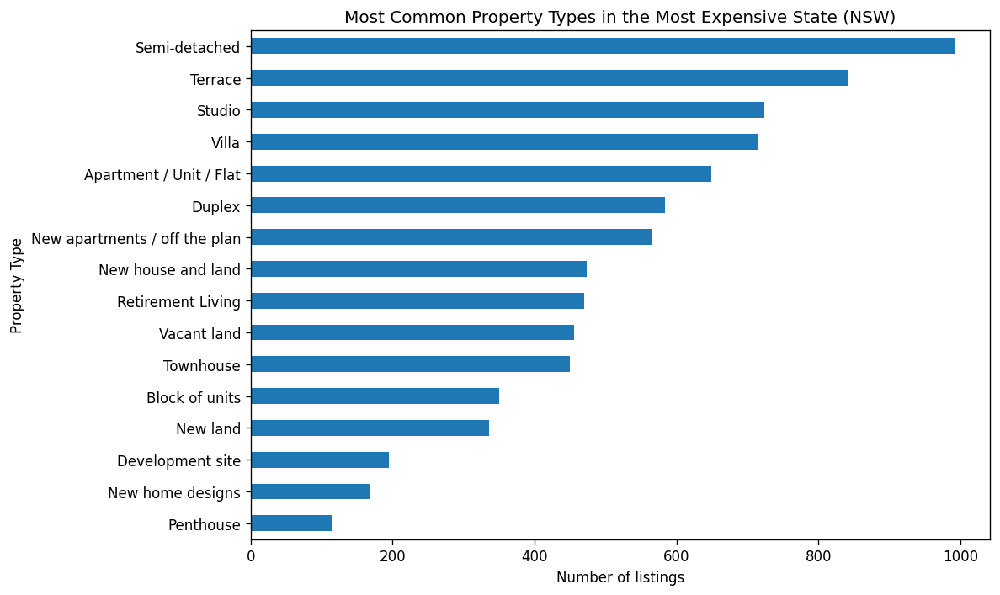

In [182]:

b = df.dropna(subset=["Price","Size","state"]).query("Price>0 and Size>0").copy()
b["ppsm"] = b["Price"] / b["Size"]
b = b.replace([np.inf, -np.inf], np.nan).dropna(subset=["ppsm"])
state_max = (b.groupby("state")["ppsm"].median().sort_values(ascending=False).index[0])

counts = (df.loc[df["state"] == state_max]
            .dropna(subset=["Type"])
            .groupby("Type")
            .size()
            .sort_values(ascending=False))

plt.figure(figsize=(10,6))
counts.iloc[::-1].plot(kind="barh")
plt.title(f"Most Common Property Types in the Most Expensive State ({state_max})")
plt.xlabel("Number of listings"); plt.ylabel("Property Type")
plt.tight_layout()

print(counts.head(10))
outpng = os.path.join(OUTDIR, "10. Most Common Property Types in the Most Expensive State (NSW).png")
plt.savefig(outpng, dpi=300, bbox_inches="tight")
print("Đã lưu:", outpng)

plt.show()


Mục tiêu: xác định các loại hình bất động sản phổ biến nhất tại bang có giá trung bình trên mỗi mét vuông (price per square meter) cao nhất — ở đây là bang New South Wales (NSW).
Mục tiêu chính là hiểu rõ cấu trúc thị trường bất động sản tại khu vực đắt đỏ nhất, từ đó rút ra nhận xét về xu hướng phát triển và nhu cầu nhà ở của người dân.

Quan sát chính:

Semi-detached (nhà liền kề bán biệt lập) là loại hình phổ biến nhất, với khoảng 1.000 tin rao bán, cho thấy mức độ ưa chuộng cao tại NSW.

Terrace và Studio cũng chiếm tỷ lệ lớn, chứng tỏ người dân ưu tiên các loại nhà có diện tích nhỏ đến trung bình, phù hợp với môi trường đô thị.

Các loại hình như Villa, Apartment/Unit/Flat, và Duplex xuất hiện nhiều, thể hiện xu hướng sống trong khu nhà chia sẻ hoặc chung cư hiện đại.

Các loại bất động sản như Penthouse, Development site, hay New home designs ít phổ biến hơn do giá trị cao, ít người có khả năng chi trả.

Kết luận:

Thị trường bất động sản tại NSW — bang có giá/m² cao nhất tập trung mạnh vào các loại nhà ở mật độ cao, diện tích nhỏ đến trung bình, đặc biệt là Semi-detached, Terrace và Studio.

Điều này phản ánh xu hướng đô thị hóa cao và quỹ đất hạn chế, khiến các dự án chung cư, nhà liền kề và căn hộ mini trở nên phổ biến.

Các loại hình sang trọng như Penthouse hay Development site có số lượng ít, thể hiện sự tập trung của phân khúc cao cấp nhưng chỉ chiếm phần nhỏ trong tổng thị trường.

Nhìn chung, NSW thể hiện mô hình thị trường nhà ở phát triển cân đối, trong đó phân khúc trung bình và đô thị chiếm ưu thế tuyệt đối.